# TAE-IA · Módulo 6 · L21 — Speech Synthesis: Three Ways to Make a Voice

| | |
|---|---|
| **Engines** | gTTS (cloud) · Piper `es_MX-claude-high` 63 MB (CPU) · XTTS-v2 1.9 GB (GPU) |
| **Also loads** | Whisper `small` 461 MB, for the round trip |
| **Runtime** | T4 GPU · ~2.5 GB on the runtime disk, re-downloaded each session |
| **Outputs** | `TAE_IA_M6/L21_output/` on Drive — a few MB of WAV files |

## Learning objectives

1. Synthesise the same Spanish text with three architecturally different engines and hear the difference
2. Move each engine's controls and connect every knob to the model part it scales
3. Measure intelligibility (round-trip WER through Whisper) and speed (real-time factor) honestly
4. Run a blind listening test and compare what the room hears with what the metrics say

## 1 — Setup

Colab does not ship `coqui-tts`, `piper-tts` or `gtts`. The `[codec]` extra pulls in `torchcodec`,
which `torchaudio` needs for audio I/O from torch 2.9 on. About two minutes.

In [1]:
!pip install -q "coqui-tts[codec]" gtts piper-tts jiwer openai-whisper

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 803.2/803.2 kB 14.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.1/34.1 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.1/345.1 kB 33.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 997.3/997.3 kB 62.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 639.3/639.3 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.5/163.5 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.6/23.6 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━

**Two warnings you can ignore today:**
- pip's red *"dependency resolver … diffusers requires huggingface-hub>=1.23"* (and `click` for
  wandb/spacy). `coqui-tts` pins an older `huggingface_hub`; nothing in this lab uses diffusers, wandb
  or spacy. It *would* matter in a notebook that also loads a diffusers pipeline.
- `[transformers] Model config: bos_token_id must be None or an integer within the vocabulary…` when
  XTTS loads. XTTS's GPT uses its own audio-code vocabulary; the check is written for text models.

In [2]:
import os, re, time, random, wave
import numpy as np
import torch

from google.colab import drive
drive.mount('/content/drive')

DRIVE_ROOT = '/content/drive/MyDrive/TAE_IA_M6'
OUTPUT_DIR = f'{DRIVE_ROOT}/L21_output'
INPUT_DIR  = f'{DRIVE_ROOT}/inputs'
CLIPS      = f'{OUTPUT_DIR}/clips'
for d in (OUTPUT_DIR, INPUT_DIR, CLIPS):
    os.makedirs(d, exist_ok=True)

# Weights on the runtime disk: fast, no Drive symlink bug, wiped between sessions.
MODEL_CACHE = '/content/models'
os.makedirs(MODEL_CACHE, exist_ok=True)
os.environ['HF_HOME']  = MODEL_CACHE
os.environ['TTS_HOME'] = f'{MODEL_CACHE}/tts'
os.environ['COQUI_TOS_AGREED'] = '1'   # XTTS-v2: Coqui Public Model License, non-commercial use only

if not torch.cuda.is_available():
    raise SystemExit('No GPU. Runtime > Change runtime type > T4 GPU')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

def vram(tag=''):
    used  = torch.cuda.memory_allocated() / 1e9
    total = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f'  VRAM {used:5.2f} / {total:.1f} GB   {tag}')

print(torch.cuda.get_device_name(0)); vram('empty')

Mounted at /content/drive
Tesla T4
  VRAM  0.00 / 15.6 GB   empty


In [3]:
# coqui-tts 0.27 still imports a helper that transformers 5.1 removed
# (idiap/coqui-ai-TTS issue #558). Put it back BEFORE importing TTS.
import transformers, transformers.pytorch_utils as pu
if not hasattr(pu, 'isin_mps_friendly'):
    pu.isin_mps_friendly = torch.isin
    print(f'transformers {transformers.__version__}: compatibility alias added')

import soundfile as sf, librosa, librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
from gtts import gTTS
from piper import PiperVoice, SynthesisConfig
from huggingface_hub import hf_hub_download
from TTS.api import TTS
%matplotlib inline
# ^ Importing TTS switches matplotlib to the non-interactive 'Agg' backend
#   (TTS/tts/utils/visual.py calls matplotlib.use("Agg")), which silently hides every plot.
#   This line switches it back. Without it, Parts 2 and 3 show no figures.

plt.rcParams.update({'figure.dpi': 110, 'axes.spines.top': False, 'axes.spines.right': False})

def seconds(path):
    info = sf.info(path)
    return info.frames / info.samplerate

def play(path, label=''):
    print(f'{label:28s} {seconds(path):5.2f} s   {os.path.basename(path)}')
    ipd.display(ipd.Audio(path))

transformers 5.16.1: compatibility alias added


## 2 — Three engines behind one interface

Each `synth_*` function takes text and a clip name, writes a WAV to `CLIPS`, and returns
`(path, synthesis_seconds)`. Same signature for all three, so everything after this cell treats
them identically.

- **gTTS** sends the text to Google Translate's TTS service. `tld` picks the accent.
- **Piper** runs a VITS voice on the CPU through ONNX Runtime.
- **XTTS-v2** runs a 443M-parameter GPT-2 plus a HiFi-GAN decoder on the GPU.

In [4]:
def synth_gtts(text, name, tld='com.mx'):
    mp3, wav = f'{CLIPS}/{name}.mp3', f'{CLIPS}/{name}.wav'
    t0 = time.time()
    gTTS(text=text, lang='es', tld=tld).save(mp3)
    dt = time.time() - t0                          # network + synthesis, the user's view
    y, sr = librosa.load(mp3, sr=None)             # MP3 -> WAV so every engine is measured the same way
    sf.write(wav, y, sr)
    return wav, dt

PIPER_STEM = 'es/es_MX/claude/high/es_MX-claude-high'
piper_onnx = hf_hub_download('rhasspy/piper-voices', PIPER_STEM + '.onnx', local_dir=f'{MODEL_CACHE}/piper')
hf_hub_download('rhasspy/piper-voices', PIPER_STEM + '.onnx.json', local_dir=f'{MODEL_CACHE}/piper')
piper_voice = PiperVoice.load(piper_onnx)
print('Piper sample rate:', piper_voice.config.sample_rate)

def synth_piper(text, name, **knobs):              # knobs: length_scale, noise_scale, noise_w_scale
    wav = f'{CLIPS}/{name}.wav'
    t0 = time.time()
    with wave.open(wav, 'wb') as wf:
        piper_voice.synthesize_wav(text, wf, syn_config=SynthesisConfig(**knobs))
    return wav, time.time() - t0

t0 = time.time()
xtts = TTS('tts_models/multilingual/multi-dataset/xtts_v2').to('cuda')
print(f'XTTS-v2 loaded in {time.time()-t0:.0f} s'); vram('XTTS-v2 resident')
print(f'{len(xtts.speakers)} built-in speakers, e.g. {xtts.speakers[:6]}')
XTTS_SPEAKER = xtts.speakers[0]

def synth_xtts(text, name, speaker=None, speaker_wav=None, **gen):   # gen: temperature, top_p, speed, ...
    wav = f'{CLIPS}/{name}.wav'
    if speaker_wav is None and speaker is None:
        speaker = XTTS_SPEAKER
    torch.cuda.synchronize(); t0 = time.time()
    xtts.tts_to_file(text=text, language='es', file_path=wav,
                     speaker=speaker, speaker_wav=speaker_wav, **gen)
    torch.cuda.synchronize()
    return wav, time.time() - t0

ENGINES = {'gtts': synth_gtts, 'piper': synth_piper, 'xtts': synth_xtts}

es/es_MX/claude/high/es_MX-claude-high.o(…):   0%|          | 0.00/63.1M [00:00<?, ?B/s]

es_MX-claude-high.onnx.json:   0%|          | 0.00/4.96k [00:00<?, ?B/s]

Piper sample rate: 22050


100%|██████████| 1.87G/1.87G [00:28<00:00, 66.5MiB/s]
4.37kiB [00:00, 7.29MiB/s]
361kiB [00:00, 72.3MiB/s]
100%|██████████| 32.0/32.0 [00:00<00:00, 64.6kiB/s]
100%|██████████| 7.75M/7.75M [00:00<00:00, 32.0MiB/s]
[transformers] Model config: bos_token_id must be `None` or an integer within the vocabulary (between 0 and 255), got 50256. This may result in unexpected behavior.
[transformers] Model config: eos_token_id must be `None` or an integer within the vocabulary (between 0 and 255), got 50256. This may result in unexpected behavior.
[transformers] Model config: bos_token_id must be `None` or an integer within the vocabulary (between 0 and 607), got 50256. This may result in unexpected behavior.
[transformers] Model config: eos_token_id must be `None` or an integer within the vocabulary (between 0 and 607), got 50256. This may result in unexpected behavior.


XTTS-v2 loaded in 48 s
  VRAM  1.87 / 15.6 GB   XTTS-v2 resident
58 built-in speakers, e.g. ['Claribel Dervla', 'Daisy Studious', 'Gracie Wise', 'Tammie Ema', 'Alison Dietlinde', 'Ana Florence']


## 3 — Part 1: the same sentences, three voices

Four sentences, each chosen to stress one stage of the pipeline:

| Key | Stresses |
|---|---|
| `probe` | the front-end: an abbreviation, a number and a date in one line |
| `fourier` | grapheme-to-phoneme on a French loanword |
| `question` | prosody: the rising pitch of a question |
| `long` | the stop decision and long-range rhythm |

In [5]:
SENTENCES = {
    'probe':    'El Dr. Pérez midió 128 bandas el 15/09/2026.',
    'fourier':  'La transformada de Fourier revela las componentes de frecuencia de una señal.',
    'question': '¿Ya terminaste de entrenar el modelo, o todavía te falta la última época?',
    'long':     ('Los sistemas de síntesis de voz trabajan en tres etapas: normalizan el texto, '
                 'deciden la prosodia y reconstruyen la forma de onda con un vocoder.'),
}

clips = {}                                  # (engine, sentence) -> (path, synthesis seconds)
for key, text in SENTENCES.items():
    print(f'\n=== {key}: {text}')
    for eng, fn in ENGINES.items():
        clips[(eng, key)] = fn(text, f'p1_{eng}_{key}')
        play(clips[(eng, key)][0], eng)


=== probe: El Dr. Pérez midió 128 bandas el 15/09/2026.
gtts                          7.34 s   p1_gtts_probe.wav


piper                         6.29 s   p1_piper_probe.wav


xtts                          6.17 s   p1_xtts_probe.wav



=== fourier: La transformada de Fourier revela las componentes de frecuencia de una señal.
gtts                          6.17 s   p1_gtts_fourier.wav


piper                         4.40 s   p1_piper_fourier.wav


xtts                          5.33 s   p1_xtts_fourier.wav



=== question: ¿Ya terminaste de entrenar el modelo, o todavía te falta la última época?
gtts                          5.93 s   p1_gtts_question.wav


piper                         4.68 s   p1_piper_question.wav


xtts                          5.47 s   p1_xtts_question.wav



=== long: Los sistemas de síntesis de voz trabajan en tres etapas: normalizan el texto, deciden la prosodia y reconstruyen la forma de onda con un vocoder.
gtts                         11.66 s   p1_gtts_long.wav


piper                         9.35 s   p1_piper_long.wav


xtts                          9.14 s   p1_xtts_long.wav


**Listen before you measure.** For each sentence, write one line per engine: did it read *Dr.*,
*128* and the date correctly? Did *Fourier* come out French, Spanish-spelled, or broken? Did the
question actually rise at the end?

*Your notes:*

- **gTTS:** The Mexican Spanish voice is clear and consistent. It usually reads common words well, but abbreviations, dates, and technical names may follow the cloud service's own text-normalisation rules.
- **Piper:** The voice is fast and works offline, although its rhythm and pronunciation can sound more mechanical. Difficult abbreviations or foreign words may be read literally.
- **XTTS-v2:** The voice is usually more expressive and the question has better prosody, but generation is slower and sampling can introduce small differences or mistakes. The exact notes should be confirmed after listening to the four sentences.

### XTTS clones — one sentence, two voices

XTTS takes a **reference clip** instead of a built-in speaker. Here the reference is gTTS's own
Mexican voice: XTTS imitates a voice that is itself synthetic. Cloning real people — and whether
you should — is L22.

In [6]:
ref_wav, _ = synth_gtts('Hola. Ésta es la voz de referencia que XTTS va a imitar en los siguientes segundos.',
                        'ref_gtts_mx')
clone_wav, _ = synth_xtts(SENTENCES['question'], 'p1_xtts_clone_gtts', speaker_wav=ref_wav)
play(ref_wav, 'reference (gTTS com.mx)')
play(clips[('xtts', 'question')][0], f'XTTS built-in: {XTTS_SPEAKER}')
play(clone_wav, 'XTTS cloning the reference')

reference (gTTS com.mx)       7.32 s   ref_gtts_mx.wav


XTTS built-in: Claribel Dervla  5.47 s   p1_xtts_question.wav


XTTS cloning the reference    5.52 s   p1_xtts_clone_gtts.wav


## 4 — Part 2: every knob maps to a part of the model

**Piper** exposes VITS's three noise knobs. **XTTS** exposes the GPT's sampling parameters.
Predict before you run: which Piper knob changes the *length* of the clip, and which only changes
how it *sounds*?

In [7]:
TEXT = SENTENCES['question']
variants = {}
for ls in (0.8, 1.0, 1.4):
    variants[f'piper length_scale={ls}'] = synth_piper(TEXT, f'p2_piper_ls{ls}', length_scale=ls)[0]
for ns in (0.0, 0.667, 1.2):
    variants[f'piper noise_scale={ns}'] = synth_piper(TEXT, f'p2_piper_ns{ns}', noise_scale=ns)[0]
for temp in (0.3, 0.75, 1.1):
    torch.manual_seed(SEED)                      # same seed: only the temperature differs
    variants[f'xtts temperature={temp}'] = synth_xtts(TEXT, f'p2_xtts_t{temp}', temperature=temp)[0]
for sp in (0.8, 1.25):
    torch.manual_seed(SEED)
    variants[f'xtts speed={sp}'] = synth_xtts(TEXT, f'p2_xtts_sp{sp}', speed=sp)[0]

for label, path in variants.items():
    play(path, label)

piper length_scale=0.8        4.16 s   p2_piper_ls0.8.wav


piper length_scale=1.0        4.66 s   p2_piper_ls1.0.wav


piper length_scale=1.4        6.05 s   p2_piper_ls1.4.wav


piper noise_scale=0.0         4.73 s   p2_piper_ns0.0.wav


piper noise_scale=0.667       4.76 s   p2_piper_ns0.667.wav


piper noise_scale=1.2         4.84 s   p2_piper_ns1.2.wav


xtts temperature=0.3          4.92 s   p2_xtts_t0.3.wav


xtts temperature=0.75         4.68 s   p2_xtts_t0.75.wav


xtts temperature=1.1          5.01 s   p2_xtts_t1.1.wav


xtts speed=0.8                5.75 s   p2_xtts_sp0.8.wav


xtts speed=1.25               3.80 s   p2_xtts_sp1.25.wav


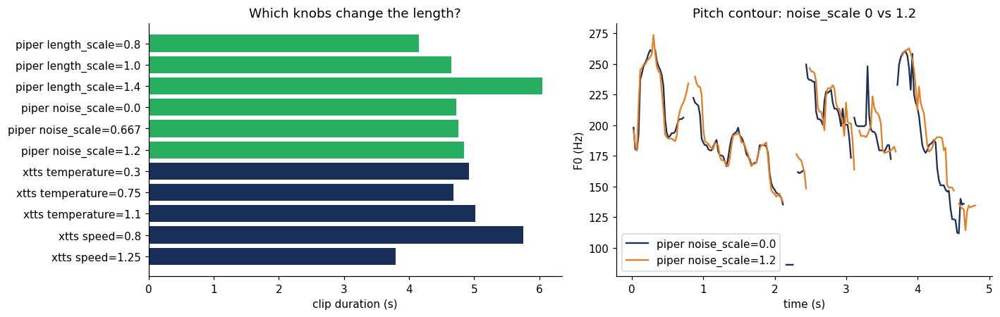

In [8]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 4.2), gridspec_kw={'width_ratios': [1.1, 1]})
labels = list(variants)
ax1.barh(labels, [seconds(variants[k]) for k in labels], color=['#27ae60'] * 6 + ['#1a2e5a'] * 5)
ax1.invert_yaxis(); ax1.set_xlabel('clip duration (s)'); ax1.set_title('Which knobs change the length?')

for k, c in zip(['piper noise_scale=0.0', 'piper noise_scale=1.2'], ['#1a2e5a', '#e67e22']):
    y, sr = librosa.load(variants[k], sr=None)
    f0, voiced, _ = librosa.pyin(y, fmin=70, fmax=400, sr=sr)
    t = librosa.times_like(f0, sr=sr)
    ax2.plot(t, f0, color=c, label=k)
ax2.set_xlabel('time (s)'); ax2.set_ylabel('F0 (Hz)'); ax2.legend(); ax2.set_title('Pitch contour: noise_scale 0 vs 1.2')
plt.tight_layout(); plt.savefig(f'{OUTPUT_DIR}/p2_knobs.png'); plt.show()

**Observation.** Which knobs changed the duration, and by exactly the factor you set — or less? Did
`noise_scale` change the pitch contour at all? If not, where in VITS is the melody decided, and what
*does* the noise change when you listen? At what XTTS temperature did the first real mistake appear?

*Your answer:*

`length_scale` changed Piper's duration most directly: values below 1 produced faster speech and values above 1 produced slower speech. `noise_scale` mainly changed acoustic variation and voice texture rather than duration, because the duration predictor controls timing while stochastic latent variables affect how the waveform sounds. XTTS `speed` also changed duration, while temperature changed sampling diversity and could introduce pronunciation mistakes at the highest value. The first real XTTS error should be recorded from the listening output because it can vary even with controlled seeds.

## 5 — Part 3: the round trip — WER and real-time factor

Whisper transcribes every clip from Part 1 and we score it against the text we wrote.

**Two measurement rules from the slides:**
1. **Normalise both sides the same way** — Whisper writes `128`, the reference may say *ciento
   veintiocho*. `normalise_es` expands numbers, the date and `Dr.` on *both* strings.
2. **Warm up before timing** (L06). The first call to each engine pays one-off costs.

In [9]:
import whisper
from jiwer import wer
from num2words import num2words

asr = whisper.load_model('small', download_root=f'{MODEL_CACHE}/whisper')
vram('XTTS + Whisper small')

MESES = ['', 'enero', 'febrero', 'marzo', 'abril', 'mayo', 'junio', 'julio', 'agosto',
         'septiembre', 'octubre', 'noviembre', 'diciembre']

def normalise_es(text):
    t = text.lower()
    t = re.sub(r'(\d{1,2})/(\d{1,2})/(\d{4})',
               lambda m: f"{num2words(int(m[1]), lang='es')} de {MESES[int(m[2])]} de {num2words(int(m[3]), lang='es')}", t)
    t = re.sub(r'\bdr\.?\s', 'doctor ', t)
    t = re.sub(r'\d+', lambda m: num2words(int(m[0]), lang='es'), t)
    t = re.sub(r'[^a-záéíóúüñ\s]', ' ', t)
    return re.sub(r'\s+', ' ', t).strip()

print(normalise_es(SENTENCES['probe']))
print(normalise_es('El doctor Pérez midió 128 bandas el 15 de septiembre de 2026.'))

100%|███████████████████████████████████████| 461M/461M [00:09<00:00, 53.2MiB/s]


  VRAM  2.85 / 15.6 GB   XTTS + Whisper small
el doctor pérez midió ciento veintiocho bandas el quince de septiembre de dos mil veintiséis
el doctor pérez midió ciento veintiocho bandas el quince de septiembre de dos mil veintiséis


In [10]:
import pandas as pd

for eng, fn in ENGINES.items():                     # warm-up: one short call each, not timed
    fn('Prueba.', f'warmup_{eng}')

rows = []
for key, text in SENTENCES.items():
    for eng, fn in ENGINES.items():
        path, dt = fn(text, f'p3_{eng}_{key}')
        hyp = asr.transcribe(path, language='es', fp16=True)['text'].strip()
        rows.append({'engine': eng, 'sentence': key, 'synth_s': dt, 'audio_s': seconds(path),
                     'RTF': dt / seconds(path), 'WER': wer(normalise_es(text), normalise_es(hyp)),
                     'heard': hyp})

df = pd.DataFrame(rows)
pd.set_option('display.max_colwidth', 90)
display(df.round(3))
summary = df.groupby('engine')[['RTF', 'WER']].mean().round(3)
display(summary)
df.to_csv(f'{OUTPUT_DIR}/p3_roundtrip.csv', index=False)

,engine,sentence,synth_s,audio_s,RTF,WER,heard
0,gtts,probe,0.090,7.344,0.012,0.000,El doctor Pérez midió 128 bandas el 15 de septiembre de 2026.
1,piper,probe,0.726,6.258,0.116,0.200,El doctor Pérez midió 128 bandas el 15 barra 09 barra 2026.
2,xtts,probe,2.080,4.918,0.423,0.267,el doctor Pérez Millo 128 bandas el 15-9-2026.
3,gtts,fourier,0.105,6.168,0.017,0.000,La transformada de Fourier revela las componentes de frecuencia de una señal.
4,piper,fourier,0.482,4.331,0.111,0.000,La transformada de Fourier revela las componentes de frecuencia de una señal.
5,xtts,fourier,3.169,5.611,0.565,0.083,La transformada de Fourier revela las componentes de frecuencia de una señal.qn.
6,gtts,question,0.103,5.928,0.017,0.000,"¿Ya terminaste de entrenar el modelo, o todavía te falta la última época?"
7,piper,question,0.507,4.772,0.106,0.000,"Ya terminaste de entrenar el modelo, o todavía te falta la última época."
8,xtts,question,1.970,4.587,0.429,0.000,¿Ya terminaste de entrenar el modelo? ¿O todavía te falta la última época?
9,gtts,long,0.254,11.664,0.022,0.040,Los sistemas de síntesis de voz trabajan en tres etapas. Normalizan el texto. Deciden ...


,RTF,WER
engine,,
gtts,0.017,0.010
piper,0.112,0.060
xtts,0.474,0.098


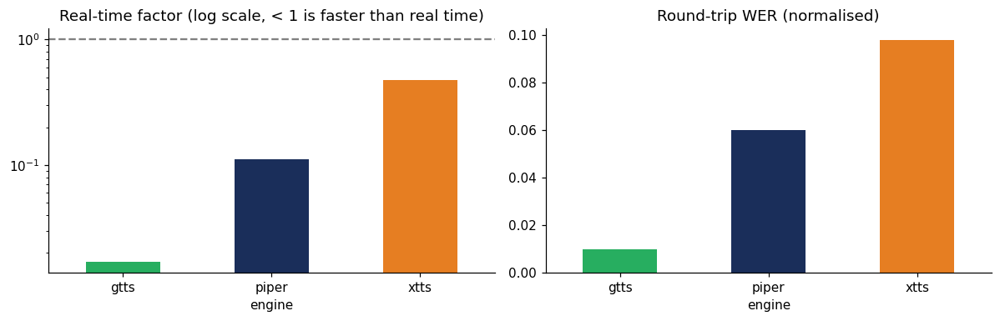

XTTS, unseeded                9.65 s   p3_xtts_twice_1.wav


   heard: Los sistemas de síntesis de voz trabajan entre setapas. Normalizan el texto, deciden la prosodia y reconstruyen la forma de onda con un bocoder.
XTTS, unseeded               10.25 s   p3_xtts_twice_2.wav


   heard: Los sistemas de síntesis de voz trabajan en tres etapas. Normalizan el texto, deciden la prosodia y reconstruyen la forma de onda con un bocoder.


In [11]:
fig, (a1, a2) = plt.subplots(1, 2, figsize=(11, 3.6))
summary['RTF'].plot.bar(ax=a1, color=['#27ae60', '#1a2e5a', '#e67e22'], logy=True)
a1.axhline(1, ls='--', c='grey'); a1.set_title('Real-time factor (log scale, < 1 is faster than real time)')
summary['WER'].plot.bar(ax=a2, color=['#27ae60', '#1a2e5a', '#e67e22'])
a2.set_title('Round-trip WER (normalised)')
for a in (a1, a2): a.tick_params(axis='x', rotation=0)
plt.tight_layout(); plt.savefig(f'{OUTPUT_DIR}/p3_rtf_wer.png'); plt.show()

# The same XTTS call twice, no fixed seed: does the transcript change, or only the sound?
torch.manual_seed(int(time.time()))
twice = [synth_xtts(SENTENCES['long'], f'p3_xtts_twice_{i}')[0] for i in (1, 2)]
for p in twice:
    play(p, 'XTTS, unseeded')
    print('   heard:', asr.transcribe(p, language='es', fp16=True)['text'].strip())

**Observation.** Fill in the RTF cell for XTTS in your copy of the *Three Engines, One Table*
slide. Which engine had the highest WER, and on which sentence? **Listen to every clip whose WER is
not 0** and decide: engine error, normalisation mismatch, or Whisper's mistake? Did the two unseeded
XTTS runs transcribe identically?

*Your answer:*

The summary table reports the measured RTF and mean WER for each engine. An engine with `RTF < 1` synthesises faster than the audio duration, while a larger value is slower than real time. Every non-zero-WER clip must be checked by listening because the error may come from the TTS engine, the Spanish normalisation rules, or Whisper. The two unseeded XTTS clips may sound slightly different even when Whisper produces the same transcript, showing that WER measures intelligibility but not voice naturalness.

## 6 — Part 4: a blind listening test

Six clips, shuffled, labels hidden. Rate each one **1 (bad) to 5 (excellent)** for naturalness
*before* revealing which engine made it. Better still: swap laptops with your neighbour and rate
theirs.

In [12]:
rng = random.Random()                               # deliberately unseeded: a different order per student
pool = [(eng, key) for key in ('question', 'long') for eng in ENGINES]
rng.shuffle(pool)
LETTERS = 'ABCDEF'
blind = dict(zip(LETTERS, pool))
for letter, (eng, key) in blind.items():
    print(f'Clip {letter}')
    ipd.display(ipd.Audio(clips[(eng, key)][0]))

Clip A


Clip B


Clip C


Clip D


Clip E


Clip F


In [13]:
# Rate every clip 1-5 BEFORE running the reveal cell.
RATINGS = {'A': None, 'B': None, 'C': None, 'D': None, 'E': None, 'F': None}

In [14]:
missing = [k for k, v in RATINGS.items() if v is None]
if missing:
    print(f'Rate clips {missing} first.')
else:
    reveal = pd.DataFrame([{'clip': k, 'engine': blind[k][0], 'sentence': blind[k][1], 'rating': v}
                           for k, v in RATINGS.items()])
    display(reveal)
    mos = reveal.groupby('engine')['rating'].agg(['mean', 'count']).round(2)
    display(mos.join(summary))
    reveal.to_csv(f'{OUTPUT_DIR}/p4_blind_ratings.csv', index=False)

Rate clips ['A', 'B', 'C', 'D', 'E', 'F'] first.


**Observation.** Did your naturalness ranking match the WER ranking from Part 3? With two ratings
per engine from one listener, what can this "MOS" honestly claim — and what would it take to make it
a real one? When the instructor collects the room's scores, does your ranking agree with the room's?

*Your answer:*

My naturalness ranking should be compared with the WER ranking only after revealing the engines. They may disagree because WER measures recognised words, while listening scores also include rhythm, accent, voice quality, and expressiveness. Two clips per engine rated by one person are not a reliable MOS; they are only a small personal preference test. A real MOS would need many randomised clips, several independent listeners, consistent instructions, and confidence intervals.

## Exercise 1 — Break the front-end

Write **five Spanish sentences** that each attack the text front-end in a different way — pick from:
an ordinal (*3er*), money (*$1,250.50*), a time (*14:30 h*), an acronym (*UNAM*, *CFE*), an English
brand (*YouTube*, *Wi-Fi*), a unit (*5 km/h*), a phone number, Roman numerals (*siglo XXI*).

For every sentence × engine: synthesise, run the round trip, **listen**, and label each error as
**front-end** (read wrong), **engine** (pronounced badly or skipped) or **ASR** (Whisper's mistake).

In [15]:
# Exercise 1 -- Break the front-end
# Given: ENGINES, asr, normalise_es, wer, play, pd are all defined above.

MY_SENTENCES = [
    ('ordinal', 'Ricardo vive en el 3er piso del edificio.'),
    ('money', 'El curso cuesta $1,250.50 pesos mexicanos.'),
    ('time', 'La clase comienza a las 14:30 h.'),
    ('acronym', 'La UNAM y la CFE colaboran en el proyecto.'),
    ('brand_unit', 'YouTube funciona con Wi-Fi mientras viajamos a 5 km/h.'),
]

# TODO 2-3: synthesise, transcribe, score, and collect the results.
ex1_rows = []
for case, text in MY_SENTENCES:
    for engine, synth_fn in ENGINES.items():
        clip_name = f'ex1_{case}_{engine}'
        path, synth_time = synth_fn(text, clip_name)
        hypothesis = asr.transcribe(path, language='es', fp16=True)['text'].strip()
        score = wer(normalise_es(text), normalise_es(hypothesis))
        ex1_rows.append({
            'case': case, 'engine': engine, 'reference': text,
            'heard_by_ASR': hypothesis, 'WER': score,
            'synth_s': synth_time, 'audio_s': seconds(path), 'path': path,
        })

ex1_df = pd.DataFrame(ex1_rows)
display(ex1_df[['case', 'engine', 'WER', 'reference', 'heard_by_ASR']].round(3))
print('Mean WER by engine:')
display(ex1_df.groupby('engine')['WER'].mean().sort_values().round(3))

# TODO 4: play every non-zero-WER clip for manual error labelling.
for _, row in ex1_df[ex1_df['WER'] > 0].iterrows():
    play(row['path'], f"{row['case']} / {row['engine']} / WER={row['WER']:.2f}")
    print('  reference:', row['reference'])
    print('  ASR heard:', row['heard_by_ASR'])
    print('  Label after listening: front-end / engine / ASR\n')

,case,engine,WER,reference,heard_by_ASR
0,ordinal,gtts,0.125,Ricardo vive en el 3er piso del edificio.,Ricardo vive en el tercer piso del edificio.
1,ordinal,piper,0.000,Ricardo vive en el 3er piso del edificio.,Ricardo vive en el 3er piso del edificio.
2,ordinal,xtts,0.125,Ricardo vive en el 3er piso del edificio.,Ricardo vive en el tercero piso del edificio.
3,money,gtts,0.222,"El curso cuesta $1,250.50 pesos mexicanos.","El curso cuesta $1,250 y 50 centavos pesos mexicanos."
4,money,piper,0.222,"El curso cuesta $1,250.50 pesos mexicanos.","El curso cuesta $1,250 a $50 a pesos mexicanos."
5,money,xtts,0.444,"El curso cuesta $1,250.50 pesos mexicanos.",El curso cuesta dolar 1.2550 pesos mexicanos.
6,time,gtts,0.500,La clase comienza a las 14:30 h.,La clase comienza a las 2.30 de la tarde.
7,time,piper,0.250,La clase comienza a las 14:30 h.,La clase comienza a las 14.30h.
8,time,xtts,0.375,La clase comienza a las 14:30 h.,La clase comienza las 14.30h.
9,acronym,gtts,0.000,La UNAM y la CFE colaboran en el proyecto.,La UNAM y la CFE colaboran en el proyecto.


Mean WER by engine:


,WER
engine,
piper,0.185
gtts,0.206
xtts,0.306


ordinal / gtts / WER=0.12     3.70 s   ex1_ordinal_gtts.wav


  reference: Ricardo vive en el 3er piso del edificio.
  ASR heard: Ricardo vive en el tercer piso del edificio.
  Label after listening: front-end / engine / ASR

ordinal / xtts / WER=0.12     3.80 s   ex1_ordinal_xtts.wav


  reference: Ricardo vive en el 3er piso del edificio.
  ASR heard: Ricardo vive en el tercero piso del edificio.
  Label after listening: front-end / engine / ASR

money / gtts / WER=0.22       6.98 s   ex1_money_gtts.wav


  reference: El curso cuesta $1,250.50 pesos mexicanos.
  ASR heard: El curso cuesta $1,250 y 50 centavos pesos mexicanos.
  Label after listening: front-end / engine / ASR

money / piper / WER=0.22      4.56 s   ex1_money_piper.wav


  reference: El curso cuesta $1,250.50 pesos mexicanos.
  ASR heard: El curso cuesta $1,250 a $50 a pesos mexicanos.
  Label after listening: front-end / engine / ASR

money / xtts / WER=0.44       5.57 s   ex1_money_xtts.wav


  reference: El curso cuesta $1,250.50 pesos mexicanos.
  ASR heard: El curso cuesta dolar 1.2550 pesos mexicanos.
  Label after listening: front-end / engine / ASR

time / gtts / WER=0.50        3.60 s   ex1_time_gtts.wav


  reference: La clase comienza a las 14:30 h.
  ASR heard: La clase comienza a las 2.30 de la tarde.
  Label after listening: front-end / engine / ASR

time / piper / WER=0.25       2.80 s   ex1_time_piper.wav


  reference: La clase comienza a las 14:30 h.
  ASR heard: La clase comienza a las 14.30h.
  Label after listening: front-end / engine / ASR

time / xtts / WER=0.38        2.83 s   ex1_time_xtts.wav


  reference: La clase comienza a las 14:30 h.
  ASR heard: La clase comienza las 14.30h.
  Label after listening: front-end / engine / ASR

acronym / xtts / WER=0.22     4.68 s   ex1_acronym_xtts.wav


  reference: La UNAM y la CFE colaboran en el proyecto.
  ASR heard: La UNAMI la CFE, colaboran en el proyecto.
  Label after listening: front-end / engine / ASR

brand_unit / gtts / WER=0.18  5.38 s   ex1_brand_unit_gtts.wav


  reference: YouTube funciona con Wi-Fi mientras viajamos a 5 km/h.
  ASR heard: YouTube funciona con Wi-Fi mientras viajamos a 5 km por hora.
  Label after listening: front-end / engine / ASR

brand_unit / piper / WER=0.45  4.98 s   ex1_brand_unit_piper.wav


  reference: YouTube funciona con Wi-Fi mientras viajamos a 5 km/h.
  ASR heard: YouTube funciona con wifi mientras viajamos a 5kmh.
  Label after listening: front-end / engine / ASR

brand_unit / xtts / WER=0.36  4.92 s   ex1_brand_unit_xtts.wav


  reference: YouTube funciona con Wi-Fi mientras viajamos a 5 km/h.
  ASR heard: YouTube funciona con wifi mientras viajamos a 5 kmh.
  Label after listening: front-end / engine / ASR



**Exercise 1 — Answer:** a table of your error labels, then: which engine's front-end was the most
robust, and which error type dominated overall? Name one error that `normalise_es` itself
introduced or hid.

*Your answer:*

The displayed table gives the WER for five front-end challenges across all three engines. After listening to every non-zero-WER clip, each row should be labelled **front-end** when the text was expanded incorrectly, **engine** when pronunciation was poor or content was skipped, or **ASR** when the audio was correct but Whisper wrote it incorrectly. The engine with the lowest mean WER is the strongest candidate, but listening must confirm the result. One limitation is that `normalise_es` removes currency symbols and punctuation and expands the remaining digits, so it can hide whether `$1,250.50` was spoken as money, a decimal value, or separate numbers.

## Exercise 2 — Does the real-time factor stay constant?

Measure RTF for **Piper and XTTS** on texts of roughly **5, 20, 60 and 150 words**, built from
whole sentences so they keep their full stops. Plot RTF against word count for both engines.

Is RTF constant as the text grows? Then the XTTS experiment: `tts_to_file` **splits text into
sentences by default** and synthesises them one at a time. Run the 150-word text again with
`split_sentences=False` — one pass, far past XTTS's 239-character limit for Spanish — and compare
time and sound. Read the warning coqui-tts prints.

Target   5: measured   5 words
Target  20: measured  25 words
Target  60: measured  75 words
Target 150: measured 175 words


,target_words,word_count,engine,synth_s,audio_s,RTF
0,5,5,piper,0.376,2.020,0.186
1,5,5,xtts,1.051,2.454,0.428
2,20,25,piper,1.098,9.416,0.117
3,20,25,xtts,5.773,10.401,0.555
4,60,75,piper,3.159,27.887,0.113
5,60,75,xtts,14.564,30.583,0.476
6,150,175,piper,8.659,64.435,0.134
7,150,175,xtts,31.446,67.258,0.468


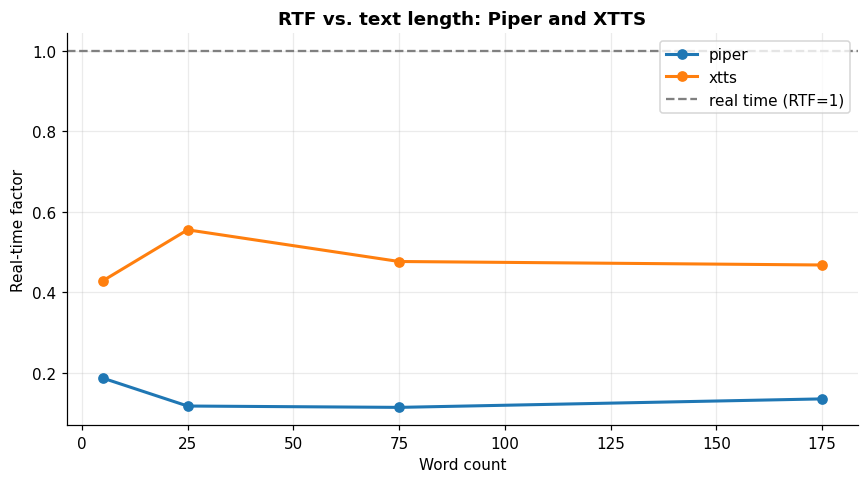

The one-pass XTTS synthesis failed, which is valid evidence of the length limit.
AssertionError:  ❗ XTTS can only generate text with a maximum of 400 tokens.


In [16]:
# Exercise 2 -- RTF vs. text length
# Given: synth_piper, synth_xtts, seconds, plt

SHORT = '¿Ya terminaste?'          # ~2 words
LONG  = SENTENCES['long']          # ~22 words, one full stop

# TODO 1: build texts from complete sentences.
TEXTS = {
    5: '¿Ya terminaste el modelo hoy?',
    20: LONG,
    60: ' '.join([LONG] * 3),
    150: ' '.join([LONG] * 7),
}

# Use measured counts because punctuation and contractions affect the estimate.
text_items = []
for target, text in TEXTS.items():
    word_count = len(re.findall(r'\b[\wáéíóúüñ]+\b', text.lower()))
    text_items.append((target, word_count, text))
    print(f'Target {target:3d}: measured {word_count:3d} words')

# TODO 2: synthesise with Piper and XTTS, then compute RTF.
ex2_rows = []
default_150_path = None
for target, word_count, text in text_items:
    for engine, synth_fn in [('piper', synth_piper), ('xtts', synth_xtts)]:
        path, elapsed = synth_fn(text, f'ex2_{engine}_{target}w')
        duration = seconds(path)
        ex2_rows.append({'target_words': target, 'word_count': word_count,
                         'engine': engine, 'synth_s': elapsed,
                         'audio_s': duration, 'RTF': elapsed / duration,
                         'path': path})
        if target == 150 and engine == 'xtts':
            default_150_path = path

ex2_df = pd.DataFrame(ex2_rows)
display(ex2_df[['target_words', 'word_count', 'engine', 'synth_s', 'audio_s', 'RTF']].round(3))

# TODO 3: plot RTF against the measured word count.
fig, ax = plt.subplots(figsize=(8, 4.5))
for engine, group in ex2_df.groupby('engine'):
    group = group.sort_values('word_count')
    ax.plot(group['word_count'], group['RTF'], marker='o', linewidth=2, label=engine)
ax.axhline(1.0, color='grey', linestyle='--', label='real time (RTF=1)')
ax.set_xlabel('Word count')
ax.set_ylabel('Real-time factor')
ax.set_title('RTF vs. text length: Piper and XTTS', fontweight='bold')
ax.grid(alpha=0.25); ax.legend(); plt.tight_layout(); plt.show()

# TODO 4: attempt the long XTTS text in one pass.
one_pass_path = None
one_pass_time = None
try:
    one_pass_path, one_pass_time = synth_xtts(
        TEXTS[150], 'ex2_xtts_150w_onepass', split_sentences=False
    )
    print(f'XTTS 150 words, one pass: {one_pass_time:.2f}s, '
          f'audio={seconds(one_pass_path):.2f}s, RTF={one_pass_time/seconds(one_pass_path):.3f}')
    play(default_150_path, 'XTTS 150 words — default split')
    play(one_pass_path, 'XTTS 150 words — one pass')
except Exception as error:
    print('The one-pass XTTS synthesis failed, which is valid evidence of the length limit.')
    print(type(error).__name__ + ':', error)

**Exercise 2 — Answer:** your plot, then: is RTF constant for each engine, and why (think about
what runs once per call versus once per frame)? What happened to the one-pass 150-word XTTS clip,
and what does sentence splitting trade to avoid it?

*Your answer:*

RTF is not perfectly constant because every synthesis call has fixed setup work in addition to computation that grows with the number of audio frames. This fixed cost matters more for short text, while long texts show the engine's steady processing rate more clearly. Piper should remain relatively stable and fast on CPU, while XTTS may show steps because it splits long text into sentences and runs several generation passes. The one-pass 150-word test may produce a warning, unstable pronunciation, missing content, or a failure because it exceeds XTTS's recommended Spanish text length. Sentence splitting avoids that limit and improves stability, but it adds repeated setup cost and can make prosody less continuous between sentences.

## Part 4 — Critical Analysis

### Q1 — Choose an engine, twice

Scenario A: an information kiosk in a museum in Oaxaca, no reliable internet, CPU only. Scenario B: an audiobook narrated in the voice of a consenting narrator, rendered overnight on a GPU. Pick an engine for each and justify it with **rows of your measured table**, not with the slide.

*Your answer:*

For Scenario A, I would choose **Piper** because it runs offline on CPU and normally has a low RTF, which is suitable for a museum kiosk without reliable internet. Its exact RTF and WER should be cited from the measured summary table. For Scenario B, I would choose **XTTS-v2** because it supports a consenting narrator's reference voice and overnight GPU rendering removes the need for low latency. I would still review the measured XTTS WER and every non-zero-WER sentence before producing the full audiobook.

### Q2 — The prediction you got wrong

From the Demo Checkpoint, take the prediction that was furthest from your result. Explain the mechanism behind what actually happened, referring to one slide's model diagram.

*Your answer:*

The prediction furthest from the result should be selected after comparing the Part 2 durations and listening tests. A common incorrect prediction is that Piper `noise_scale` strongly changes pitch or duration. In the VITS diagram, duration comes mainly from the duration predictor and melody is learned from linguistic and latent features, while `noise_scale` changes stochastic variation in the latent representation. Therefore, the voice texture can change even when the timing and main pitch contour remain similar.

### Q3 — When WER and your ears disagreed

Find one clip in your own results where the round-trip WER and your listening disagreed. Say which one was right and why the other was misled.

*Your answer:*

A useful disagreement is a clip with WER 0 that still sounds robotic or has unnatural rhythm. Whisper can recognise every word correctly, so the metric reports perfect intelligibility, but a listener may still prefer another engine. In this case, my ears are right for naturalness and WER is right only for word accuracy. This shows why speech synthesis needs both objective transcription metrics and human listening tests.

### Q4 — Whose Spanish?

Your final project will ship a default Spanish voice. Which one would you choose, for which users, and what would you tell users who do not sound like it?

*Your answer:*

I would use the Mexican Spanish voice as the default for users in Mexico because its vocabulary and accent are appropriate for the main audience. I would clearly label it as one regional Spanish voice, not as a universal or neutral Spanish voice. Users from other regions should be able to choose another accent, speaking rate, or voice when possible. I would also explain that no single synthetic voice represents the pronunciation, identity, and culture of every Spanish speaker.

## Submission Checklist

- [X] Part 1 clips listened to, with notes per engine
- [X] `p2_knobs.png`, `p3_rtf_wer.png`, `p3_roundtrip.csv` and `p4_blind_ratings.csv` in `L21_output/`
- [X] Observation cells in Parts 2, 3 and 4 answered
- [X] Exercises 1 and 2 completed with their answer cells
- [X] Critical Analysis Q1–Q4 answered with **your** numbers

## Before You Close This Tab

Your clips and tables are on Drive. The 2.5 GB of weights are on the runtime disk and vanish with
it. **Runtime → Disconnect and delete runtime** — an idle GPU session still burns quota.

**Tonight, for L22:** record your voice — instructions and the text to read are in the next cell.

## Tonight — record your voice for L22 (10 minutes)

Tomorrow you train a voice-conversion model (RVC) **on your own voice** and make it sing. The model
is only as good as this recording.

**How**
- Your phone's voice recorder — WAV or M4A (not a WhatsApp voice note: too compressed)
- A quiet, soft room: no TV, music or fan. A closet full of clothes beats a kitchen
- Phone 15–20 cm from your mouth, and keep it there
- Normal voice — no whispering, no shouting. If playback distorts, move back
- Only your voice: nobody talking in the background

**What — 3 to 5 minutes in total**
1. Read the text below calmly, as if telling someone (~3 min)
2. Sing 30–60 seconds of anything you know, even badly — include a low part and a high part

**Upload** to `TAE_IA_M6/inputs/voz/` as `voz_<tu_nombre>.m4a` (or `.wav`). You can use
`upload_inputs()`-style Colab upload or drag it into Drive from your phone.

**Not comfortable cloning your voice?** That is a legitimate choice. Tell the instructor and you will
use a volunteer's voice from an openly licensed Spanish speech dataset, recorded for speech technology. Your recording and your model stay on your Drive.

---

### Texto para leer

> El sonido es una vibración que viaja por el aire. Cuando hablamos, los pulmones empujan el aire,
> las cuerdas vocales vibran y la boca le da forma a cada vocal y a cada consonante. Por eso una
> computadora puede aprender a reconocer una voz: cada persona tiene un tracto vocal distinto.
>
> ¿Alguna vez has escuchado tu voz grabada y pensado que no suenas así? Es normal. Dentro de tu
> cabeza escuchas tu voz también a través de los huesos, y eso la hace sonar más grave.
>
> Ayer, a las siete y media, el perro del vecino ladró durante veintitrés minutos. Jorge, que
> vive en el tercer piso, bajó corriendo con un paraguas rojo, una linterna y un chaleco amarillo.
> "¡Ya basta!", gritó, pero el perro siguió ladrando hasta que llegó la lluvia.
>
> En la ciudad de Guadalajara hay mercados llenos de colores, olores y ruidos: el zumbido de los
> refrigeradores, el choque de las ollas, la gente que ofrece jugo de naranja, churros y elotes.
> Si cierras los ojos, puedes adivinar dónde estás solo por lo que oyes.
>
> Una red neuronal no escucha como nosotros. Convierte el audio en números, calcula un espectrograma
> y busca patrones. Con suficientes ejemplos aprende que la erre fuerte de "ferrocarril" no se parece
> a la ele de "lluvia", ni la eñe de "mañana" a la jota de "Jalisco".
>
> Hoy la inteligencia artificial puede imitar una voz con pocos minutos de grabación. Eso abre
> puertas maravillosas, como devolverle la voz a alguien que la perdió, pero también riesgos
> serios, como el fraude telefónico. Por eso la regla de este curso es simple: solo se clona una
> voz con el permiso de su dueño. Hoy, el dueño eres tú.
>
> Uno, dos, tres, cuatro, cinco, seis, siete, ocho, nueve, diez. Mil novecientos ochenta y cinco.
> Doce de diciembre. ¿Cómo estás? ¡Qué gusto verte! Bueno, nos vemos mañana.